# 03 · 송도 20개 지점의 실제 관측 경로 대조

02는 전체 800개 파일의 **도로 구역 번호 순서**를 정리하고 20개 지도를 만들었습니다. 차량 관측점의 상세 화면은 선택한 A지점 차량 하나였습니다. 이번에는 **전체 20개 지점, 모든 궤적 기록과 모든 구역 순서**에 실제 관측 위치를 연결합니다.

- 02 입력 실행: `20260916T084027Z_f3ab95c0`. 01 입력 실행: `20260916T063821Z_28f9e8ee`. 다른 실행을 자동 선택하지 않습니다.
- 원자료 800개를 지점당 40개씩, 한 파일 안에서는 청크로 읽습니다. `Vehicle_ID, Ortho_X, Ortho_Y` 세 열만 사용합니다.
- 각 경로의 관측점 위치를 1600×1600 화면 픽셀로 저장합니다. 같은 화면 픽셀의 점은 겹쳐서 하나로 보입니다. **이는 표시용 축소이며, 교통량·노출·상충 빈도 또는 시간 분석이 아닙니다.**
- 점을 선으로 연결하거나 공백을 보간하지 않습니다. 차량쌍, 회전 방향, TTC/PET, EVT는 계산하지 않습니다.
- 무라벨·한 구역·빈 구역 순서의 차량도 대상에 남깁니다. 유한하지 않거나 영상 밖의 좌표는 건수를 별도로 남기며 차량 자체를 삭제하지 않습니다.
- 원자료, 01·02 노트북과 기존 결과는 읽기 전용입니다. 새 결과만 `data/processed/songdo_route_geometry/<새 실행 ID>/`에 저장합니다.
- E·R처럼 지도 다각형 꼭짓점이 영상 밖에 있어도, 좌표가 유한하면 그대로 그린 뒤 화면 경계에서 잘라 표시합니다. 꼭짓점을 영상 안으로 옮기지 않습니다. 영상의 흰 배경 위에 그려진 다각형이 실제 촬영 범위나 관측 존재를 보장하지는 않습니다.

**전체 20지점 결과가 먼저 나옵니다.** 추가 확대는 기본적으로 생략하며 특정 지점·경로를 직접 선택할 때만 보여 줍니다. M1의 교차경로와 M2의 같은 접근차로 앞뒤 차량 관계를 정하기 위한 위치 확인 단계입니다. M2에 완전한 교차로 통과 궤적이 필수인 것은 아니며 이번 결과가 사건 추출 또는 사고 예측 결과는 아닙니다.


## 1. 준비
01·02와 같은 패키지를 사용합니다. 자동 설치하지 않습니다.


In [1]:
from pathlib import Path
from datetime import datetime, timezone
import hashlib
import importlib.util
import io
import json
import time
import uuid

packages = {"pandas": "pandas", "numpy": "numpy", "PIL": "Pillow", "IPython": "IPython"}
missing = [p for m, p in packages.items() if importlib.util.find_spec(m) is None]
if missing:
    raise ImportError("별도 셀에서 설치하세요: %pip install " + " ".join(missing))
import pandas as pd
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
print("준비 완료 | pandas", pd.__version__, "| numpy", np.__version__)


준비 완료 | pandas 3.0.5 | numpy 2.4.6


## 2. 입력과 표시 해상도 고정
1600픽셀은 화면 출력 크기입니다. 거리·속도·상충의 판정 기준이 아닙니다.


In [2]:
PROJECT = next((p for p in [Path.cwd().resolve(), *Path.cwd().resolve().parents]
                if (p / "AGENTS.md").is_file() and (p / "data/raw").is_dir()), None)
if PROJECT is None:
    raise FileNotFoundError("프로젝트 또는 analysis 폴더에서 실행하세요.")
RAW = (PROJECT / "data/raw").resolve()
SOURCE01_ID = "20260916T063821Z_28f9e8ee"
SOURCE02_ID = "20260916T084027Z_f3ab95c0"
SOURCE01 = (PROJECT / "data/processed/songdo_movement" / SOURCE01_ID).resolve()
SOURCE02 = (PROJECT / "data/processed/songdo_routes" / SOURCE02_ID).resolve()
OUTPUT_ROOT = (PROJECT / "data/processed/songdo_route_geometry").resolve()
if (not OUTPUT_ROOT.is_relative_to(PROJECT) or any(OUTPUT_ROOT.is_relative_to(p) for p in [RAW, SOURCE01, SOURCE02])):
    raise ValueError("출력 경로가 입력과 겹칩니다.")
SITES = list("ABCEFGHIJKLMNOPQRSTU")
DATES = [f"2022-10-{d:02d}" for d in range(4, 8)]
SESSIONS = [f"{p}{i}" for p in ["AM", "PM"] for i in range(1, 6)]
EXPECTED = {f"{d}_{s}_{t}": (d, s, t) for d in DATES for s in SITES for t in SESSIONS}
ORIGINAL_SIZE, DISPLAY_SIZE = 8000, 1600
PIXELS_PER_ROUTE = DISPLAY_SIZE * DISPLAY_SIZE
CHUNK_SIZE = 250_000
PROVENANCE_KEYS = ["source_file", "file_stem", "date", "site", "session"]
GEOMETRY_COLUMNS = ["n_processed_trajectories", "n_observed_rows", "n_plotted_rows", "n_nonfinite_rows", "n_outside_rows"]
CORNERS = [("tlx", "tly"), ("blx", "bly"), ("brx", "bry"), ("trx", "try")]
MAP_COORDS = [c for pair in CORNERS for c in pair]
print("입력 02:", SOURCE02_ID, "| 전체:", len(EXPECTED), "개 파일")


입력 02: 20260916T084027Z_f3ab95c0 | 전체: 800 개 파일


## 3. 읽기 검증과 안전한 저장 함수
파일 크기·수정 시각은 문자열로 보존하여 나노초 정밀도를 잃지 않게 합니다. 01·02 요약과 제어 파일에는 해시를 남깁니다. 원본 CSV는 읽기 전후 파일 정보로 변경을 확인하며 전체 원본 해시를 새로 계산하지 않습니다.


In [3]:
def now_utc():
    return datetime.now(timezone.utc).isoformat()


def signature(path):
    stat = Path(path).stat()
    return {"size_bytes": str(stat.st_size), "mtime_ns": str(stat.st_mtime_ns)}


def assert_signature(path, expected):
    if signature(path) != {k: str(expected[k]) for k in ["size_bytes", "mtime_ns"]}:
        raise RuntimeError("입력 파일 크기 또는 수정 시각 변경: " + str(path))


def stable_bytes(path, expected=None):
    before = signature(path)
    if expected is not None:
        assert_signature(path, expected)
    content = Path(path).read_bytes()
    assert_signature(path, before)
    return content, {**before, "sha256": hashlib.sha256(content).hexdigest()}


def source_path(relative, base):
    path = (PROJECT / str(relative)).resolve()
    if not path.is_relative_to(base.resolve()) or not path.is_file():
        raise ValueError("허용된 입력 파일이 아닙니다: " + str(path))
    return path


def target_path(path):
    path = Path(path).resolve()
    if not path.is_relative_to(RUN_DIR.resolve()) or any(path.is_relative_to(p) for p in [RAW, SOURCE01, SOURCE02]):
        raise ValueError("이번 실행 폴더 밖에는 저장하지 않습니다.")
    return path


def save_csv(table, path):
    target = target_path(path)
    temporary = target.with_name(target.name + ".tmp")
    table.to_csv(temporary, index=False, encoding="utf-8-sig")
    temporary.replace(target)


def save_json(value, path):
    target = target_path(path)
    temporary = target.with_name(target.name + ".tmp")
    temporary.write_text(json.dumps(value, ensure_ascii=False, indent=2), encoding="utf-8")
    temporary.replace(target)


def save_npz(arrays, path):
    target = target_path(path)
    temporary = target.with_name(target.name + ".tmp")
    with temporary.open("wb") as handle:
        np.savez_compressed(handle, **arrays)
    temporary.replace(target)


def save_image(image, path):
    target = target_path(path)
    temporary = target.with_name(target.name + ".tmp")
    image.save(temporary, format="PNG")
    temporary.replace(target)


def nonnegative_ints(values, label):
    numbers = pd.to_numeric(values, errors="raise")
    if not np.isfinite(numbers).all() or numbers.lt(0).any() or numbers.mod(1).ne(0).any():
        raise ValueError("음수 또는 정수가 아닌 집계: " + label)
    return numbers.astype("int64")


def route_identity(site, sequence):
    payload = json.dumps([site, sequence], ensure_ascii=False, separators=(",", ":"))
    return hashlib.sha256(payload.encode("utf-8")).hexdigest()

print("함수 정의 완료. 아직 원자료 본문을 처리하지 않았습니다.")


함수 정의 완료. 아직 원자료 본문을 처리하지 않았습니다.


## 4. 전체 입력 범위와 02 결과 확인
전체 800개, 20지점, 7,228개 구역 순서, 688,840개 궤적 기록의 출처를 대조합니다. 실제 원본 본문 읽기는 8번에서 시작합니다.


In [4]:
controls = {}
def read_control(base, name, **kwargs):
    path = base / name
    content, fingerprint = stable_bytes(path)
    controls[path.relative_to(PROJECT).as_posix()] = fingerprint
    if name.endswith(".json"):
        return json.loads(content.decode("utf-8-sig"))
    return pd.read_csv(io.BytesIO(content), keep_default_na=False, **kwargs)

meta02 = read_control(SOURCE02, "run_metadata.json")
meta01 = read_control(SOURCE01, "run_metadata.json")
for meta, expected_id in [(meta01, SOURCE01_ID), (meta02, SOURCE02_ID)]:
    if not (meta.get("run_id") == expected_id and meta.get("status") == "completed"
            and meta.get("completed_files") == 800 and meta.get("failed_files") == 0):
        raise ValueError("입력 실행이 전체 완료 상태가 아닙니다.")
if meta02.get("source_run_id") != SOURCE01_ID:
    raise ValueError("02의 01 출처 실행 불일치")
manifest = read_control(SOURCE02, "input_manifest.csv", dtype={"size_bytes": "string", "mtime_ns": "string",
                              "summary_size_bytes": "string", "summary_mtime_ns": "string"})
progress02 = read_control(SOURCE02, "progress.csv", dtype={"source_summary_size_bytes": "string", "source_summary_mtime_ns": "string"})
progress01 = read_control(SOURCE01, "progress.csv")
manifest01 = read_control(SOURCE01, "input_manifest.csv", dtype={"size_bytes": "string", "mtime_ns": "string"})
catalog02 = read_control(SOURCE02, "route_catalog.csv")
map_index02 = read_control(SOURCE02, "map_index.csv", dtype={"Section": "string", "Lane": "string"})
for name, table in [("02 manifest", manifest), ("01 manifest", manifest01), ("02 progress", progress02), ("01 progress", progress01)]:
    if len(table) != 800 or table["file_stem"].duplicated().any() or table["source_file"].duplicated().any() or set(table["file_stem"]) != set(EXPECTED):
        raise ValueError(name + ": 전체 파일 범위 또는 고유성 불일치")
    for item in table.to_dict("records"):
        d, s, t = EXPECTED[item["file_stem"]]
        if ((item["date"], item["site"], item["session"]) != (d, s, t)
                or item["source_file"] != f"data/raw/{d}_{s}/{item['file_stem']}.csv"):
            raise ValueError(name + ": 날짜·지점·세션·경로 불일치")
    if "status" in table and not table["status"].eq("completed").all():
        raise ValueError(name + ": 미완료 파일 존재")
for col in ["size_bytes", "mtime_ns"]:
    if not manifest.set_index("file_stem")[col].sort_index().equals(manifest01.set_index("file_stem")[col].sort_index()):
        raise ValueError("01·02 원본 파일 정보 불일치")
if len(catalog02) != 7228 or catalog02["route_id"].duplicated().any() or set(catalog02["site"]) != set(SITES):
    raise ValueError("02 경로 카탈로그 범위 또는 고유성 불일치")
for col in ["n_trajectories", "n_rows", "n_source_files"]:
    catalog02[col] = nonnegative_ints(catalog02[col], col)
if int(catalog02["n_trajectories"].sum()) != 688840:
    raise ValueError("02 전체 궤적 수 불일치")
for row in catalog02.to_dict("records"):
    if route_identity(row["site"], json.loads(row["section_sequence_json"])) != row["route_id"]:
        raise ValueError("경로 ID와 구역 순서 불일치")
if int(catalog02["n_rows"].sum()) != int(progress02["n_rows"].sum()):
    raise ValueError("02 카탈로그와 progress의 관측행 합계 불일치")
expected_members = {stem + "_routes.csv" for stem in EXPECTED}
if {p.name for p in (SOURCE02 / "route_members").glob("*.csv")} != expected_members:
    raise ValueError("02 route_members 파일 목록이 예상 800개와 다릅니다.")
input_rows = []
for item in manifest.sort_values(["site", "file_stem"]).to_dict("records"):
    assert_signature(source_path(item["source_file"], RAW), item)
    member = SOURCE02 / "route_members" / (item["file_stem"] + "_routes.csv")
    sig = signature(member)
    input_rows.append({**item, "member_file": member.relative_to(PROJECT).as_posix(),
                       "member_size_bytes": sig["size_bytes"], "member_mtime_ns": sig["mtime_ns"]})
inputs = pd.DataFrame(input_rows)
counts01 = progress01.set_index("file_stem").to_dict("index")
counts02 = progress02.set_index("file_stem").to_dict("index")
if not inputs.groupby("site").size().eq(40).all():
    raise ValueError("지점별 40개 입력 조건 불일치")
print("입력 확인: 800개 파일 / 20개 지점 / 7,228개 관측 구역 순서 / 688,840개 궤적")


입력 확인: 800개 파일 / 20개 지점 / 7,228개 관측 구역 순서 / 688,840개 궤적


## 5. 지도 표시 준비 — 경계 밖 꼭짓점을 옮기지 않기
02의 지도 번호·원꼭짓점을 그대로 대조합니다. 유한 좌표인 다각형은 그대로 그리고 화면 밖 부분만 잘립니다. 꼭짓점을 화면 안으로 강제로 옮기지 않습니다. 라벨 중심이 화면 밖이면 문자를 임의 위치로 이동하지 않고 건수로 남깁니다. 지도 색은 구역 식별 보조이며 같은 색이 반복될 수 있습니다.


In [5]:
map_fingerprints = meta02["map_source_fingerprints"]
map_index = map_index02.copy()
if set(map_index["site"]) != set(SITES) or map_index.duplicated(["site", "Section", "Lane"]).any():
    raise ValueError("지도 지점 또는 구역·차로 식별자 불일치")
for site in SITES:
    info = map_fingerprints[site]
    lane_path = source_path(info["lane_file"], RAW)
    content, current = stable_bytes(lane_path, info["lane"])
    if current["sha256"] != info["lane"]["sha256"]:
        raise ValueError("02 이후 지도 구역 파일 내용 변경: " + site)
    lanes = pd.read_csv(io.BytesIO(content), dtype={"Section": "string", "Lane": "string"}, keep_default_na=False)
    saved = map_index.loc[map_index["site"].eq(site)].reset_index(drop=True)
    if not lanes[["Section", "Lane"]].equals(saved[["Section", "Lane"]]):
        raise ValueError("02 지도 인덱스와 원본 구역·차로 불일치: " + site)
    if not np.array_equal(lanes[MAP_COORDS].to_numpy(dtype=float), saved[MAP_COORDS].to_numpy(dtype=float), equal_nan=True):
        raise ValueError("02 지도 인덱스와 원본 꼭짓점 불일치: " + site)
    assert_signature(source_path(info["image_file"], RAW), info["image"])
coords = map_index[MAP_COORDS].apply(pd.to_numeric, errors="coerce")
map_index[MAP_COORDS] = coords
map_index["coordinates_finite"] = np.isfinite(coords).all(axis=1)
map_index["vertices_within_image"] = coords.ge(0).all(axis=1) & coords.le(ORIGINAL_SIZE).all(axis=1) & map_index["coordinates_finite"]
map_index["centroid_x"] = coords[[x for x, y in CORNERS]].mean(axis=1)
map_index["centroid_y"] = coords[[y for x, y in CORNERS]].mean(axis=1)
map_index["label_center_within_image"] = (map_index["coordinates_finite"]
    & map_index["centroid_x"].between(0, ORIGINAL_SIZE, inclusive="left")
    & map_index["centroid_y"].between(0, ORIGINAL_SIZE, inclusive="left"))
map_display_summary = map_index.groupby("site").agg(
    n_polygons=("Section", "size"), n_finite_polygons=("coordinates_finite", "sum"),
    n_polygons_all_vertices_inside=("vertices_within_image", "sum"),
    n_labels_center_inside=("label_center_within_image", "sum"))
PALETTE = [(255, 215, 70), (90, 220, 255), (255, 130, 200), (130, 240, 125), (255, 160, 85), (185, 165, 255)]
font_path = Path("C:/Windows/Fonts/arial.ttf")
font = ImageFont.truetype(str(font_path), 14) if font_path.is_file() else ImageFont.load_default()


def draw_map(site, pixels, caption):
    info = map_fingerprints[site]
    image_path = source_path(info["image_file"], RAW)
    assert_signature(image_path, info["image"])
    assert_signature(source_path(info["lane_file"], RAW), info["lane"])
    with Image.open(image_path) as original:
        if original.size != (ORIGINAL_SIZE, ORIGINAL_SIZE):
            raise ValueError("정사영상 크기가 8000×8000이 아닙니다: " + site)
        image = original.convert("RGB").resize((DISPLAY_SIZE, DISPLAY_SIZE), Image.Resampling.LANCZOS)
    assert_signature(image_path, info["image"])
    pixels = np.asarray(pixels, dtype=np.uint32)
    if pixels.size and int(pixels.max()) >= PIXELS_PER_ROUTE:
        raise ValueError("표시 픽셀 범위 오류")
    shown = np.array(image, copy=True)
    shown[pixels // DISPLAY_SIZE, pixels % DISPLAY_SIZE] = (255, 35, 35)
    image = Image.fromarray(shown)
    drawing = ImageDraw.Draw(image)
    lanes = map_index.loc[map_index["site"].eq(site)]
    colors = {section: PALETTE[i % len(PALETTE)] for i, section in enumerate(sorted(lanes["Section"].unique()))}
    scale = DISPLAY_SIZE / ORIGINAL_SIZE
    for row in lanes.to_dict("records"):
        if not row["coordinates_finite"]:
            continue
        polygon = [(float(row[x]) * scale, float(row[y]) * scale) for x, y in CORNERS]
        drawing.line(polygon + [polygon[0]], fill=colors[row["Section"]], width=2)
        if row["label_center_within_image"]:
            drawing.text((row["centroid_x"] * scale, row["centroid_y"] * scale),
                         str(row["Section"]) + "/" + str(row["Lane"]), font=font,
                         fill=colors[row["Section"]], stroke_width=1, stroke_fill="black")
    drawing.rectangle((8, 8, 1250, 65), fill=(20, 20, 20))
    drawing.text((16, 14), f"Site {site} | Red: observed display pixels | no time or direction", font=font, fill="white")
    drawing.text((16, 39), caption, font=font, fill="white")
    return image

display(map_display_summary)
print("좌표가 유한한 다각형은 경계 밖 꼭짓점이 있어도 원형대로 그립니다. 영상 흰 배경은 관측 존재를 뜻하지 않습니다.")


,n_polygons,n_finite_polygons,n_polygons_all_vertices_inside,n_labels_center_inside
site,,,,
A,46,46,46,46
B,127,127,127,127
C,21,21,21,21
E,42,42,32,42
F,74,74,74,74
G,63,63,63,63
H,40,40,40,40
I,79,79,79,79
J,76,76,76,76


좌표가 유한한 다각형은 경계 밖 꼭짓점이 있어도 원형대로 그립니다. 영상 흰 배경은 관측 존재를 뜻하지 않습니다.


## 6. 원자료의 모든 차량·관측점을 경로에 연결하는 함수
파일 안에서만 차량 ID를 연결합니다. 정상 ID가 02 차량 목록에 없으면 중단합니다. 실제 차량별 행 수와 02의 `n_rows`를 대조합니다.

지점 안의 경로 번호와 화면 픽셀을 하나의 정수로 묶어 실제 관측 위치만 저장합니다. 같은 픽셀의 반복은 표시용으로 합치지만 원관측행 수는 따로 보존합니다. 시간 순서·방향·동시관측 여부는 이 점 그림에 들어 있지 않습니다.


In [6]:
def validate_members(members, item, site_catalog):
    required = {"Vehicle_ID", "actor_id", "route_id", "section_sequence_json", "n_rows", "source_run_id", *PROVENANCE_KEYS}
    if not required.issubset(members.columns):
        raise ValueError("02 차량 요약의 필수 열 누락")
    members = members.copy()
    members["Vehicle_ID"] = members["Vehicle_ID"].astype("string")
    if not members["Vehicle_ID"].str.fullmatch(r"[1-9]\d*", na=False).all() or members["Vehicle_ID"].duplicated().any():
        raise ValueError("차량 ID 형식 또는 고유성 오류")
    for key in PROVENANCE_KEYS:
        if not members[key].eq(item[key]).all():
            raise ValueError("02 차량 요약 출처 불일치: " + key)
    if not members["source_run_id"].eq(SOURCE01_ID).all():
        raise ValueError("02 차량 요약의 01 출처 불일치")
    if not members["actor_id"].eq(item["source_file"] + "::" + members["Vehicle_ID"]).all():
        raise ValueError("파일+차량 ID 식별자 불일치")
    members["n_rows"] = nonnegative_ints(members["n_rows"], "members.n_rows")
    expected = counts02[item["file_stem"]]
    if len(members) != int(expected["n_trajectories"]) or int(members["n_rows"].sum()) != int(expected["n_rows"]):
        raise ValueError("02 progress와 차량 또는 행 수 불일치")
    sequence_by_route = site_catalog.set_index("route_id")["section_sequence_json"]
    mapped = members["route_id"].map(sequence_by_route)
    if mapped.isna().any() or not mapped.eq(members["section_sequence_json"]).all():
        raise ValueError("차량의 경로 ID·순서가 지점 카탈로그와 다릅니다.")
    return members


def accumulate_file(chunks, members, route_ids, expected_counts):
    actor_index = pd.Index(members["Vehicle_ID"])
    route_index = pd.Index(route_ids)
    actor_routes = route_index.get_indexer(members["route_id"])
    if (actor_routes < 0).any():
        raise ValueError("카탈로그에 없는 차량 경로")
    n_routes = len(route_ids)
    actor_rows = np.zeros(len(members), dtype=np.int64)
    counts = np.zeros((n_routes, len(GEOMETRY_COLUMNS)), dtype=np.int64)
    counts[:, 0] = np.bincount(actor_routes, minlength=n_routes)
    key_parts = []
    n_source_rows = n_invalid_id_rows = 0
    for chunk in chunks:
        n_source_rows += len(chunk)
        ids = chunk["Vehicle_ID"].astype("string")
        valid_id = ids.str.fullmatch(r"[1-9]\d*", na=False).to_numpy(dtype=bool)
        n_invalid_id_rows += int((~valid_id).sum())
        ids_valid = ids.loc[valid_id]
        actor_positions = actor_index.get_indexer(ids_valid)
        if (actor_positions < 0).any():
            raise ValueError("원자료의 정상 차량 ID가 02 목록에 없습니다: " + str(ids_valid.iloc[np.flatnonzero(actor_positions < 0)[0]]))
        actor_rows += np.bincount(actor_positions, minlength=len(members))
        routes = actor_routes[actor_positions]
        xy = chunk.loc[valid_id, ["Ortho_X", "Ortho_Y"]].apply(pd.to_numeric, errors="coerce").to_numpy(dtype=float)
        finite = np.isfinite(xy).all(axis=1)
        inside = finite & (xy >= 0).all(axis=1) & (xy < ORIGINAL_SIZE).all(axis=1)
        outside = finite & ~inside
        for column, mask in [(1, np.ones(len(routes), dtype=bool)), (2, inside), (3, ~finite), (4, outside)]:
            counts[:, column] += np.bincount(routes[mask], minlength=n_routes)
        if inside.any():
            display_xy = np.floor(xy[inside] * (DISPLAY_SIZE / ORIGINAL_SIZE)).astype(np.uint64)
            pixels = display_xy[:, 1] * np.uint64(DISPLAY_SIZE) + display_xy[:, 0]
            if (pixels >= PIXELS_PER_ROUTE).any():
                raise ValueError("화면 픽셀 변환 범위 오류")
            keys = routes[inside].astype(np.uint64) * np.uint64(PIXELS_PER_ROUTE) + pixels
            key_parts.append(np.unique(keys))
    if n_source_rows != int(expected_counts["n_source_rows"]) or n_invalid_id_rows != int(expected_counts["n_invalid_id_rows"]):
        raise ValueError("01의 전체 행 수 또는 ID 오류 행 수와 다릅니다.")
    if not np.array_equal(actor_rows, members["n_rows"].to_numpy(dtype=np.int64)):
        raise ValueError("실제 차량별 관측행 수가 02 요약과 다릅니다.")
    if not np.array_equal(counts[:, 1], counts[:, 2:].sum(axis=1)):
        raise ValueError("지도 안·비유한·지도 밖 관측행 합계 불일치")
    keys = np.unique(np.concatenate(key_parts)) if key_parts else np.array([], dtype=np.uint64)
    return {"keys": keys, "counts": counts, "n_source_rows": n_source_rows, "n_invalid_id_rows": n_invalid_id_rows}


def arrays_by_route(keys, route_ids):
    # 한 지점의 희소 픽셀만 분리한다. 경로별 대형 빈 이미지는 만들지 않는다.
    route_codes = keys // np.uint64(PIXELS_PER_ROUTE)
    arrays = {}
    for index, route_id in enumerate(route_ids):
        start = np.searchsorted(route_codes, index, side="left")
        end = np.searchsorted(route_codes, index, side="right")
        arrays[route_id] = (keys[start:end] % np.uint64(PIXELS_PER_ROUTE)).astype(np.uint32)
    return arrays

print("연결 함수 준비 완료. 아직 원자료 본문을 읽지 않았습니다.")


연결 함수 준비 완료. 아직 원자료 본문을 읽지 않았습니다.


## 7. 이번 실행 폴더 만들기
매번 새 폴더를 만듭니다. 8번을 다시 시작하려면 이 셀부터 새 실행을 만드세요. 이전 실행을 이어 쓰거나 덮어쓰지 않습니다.


In [7]:
RUN_ID = datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%SZ") + "_" + uuid.uuid4().hex[:8]
RUN_DIR = (OUTPUT_ROOT / RUN_ID).resolve()
if not RUN_DIR.is_relative_to(OUTPUT_ROOT) or any(RUN_DIR.is_relative_to(p) for p in [RAW, SOURCE01, SOURCE02]):
    raise ValueError("출력 폴더 경로 오류")
RUN_DIR.mkdir(parents=True, exist_ok=False)
for folder in ["site_pixels", "site_catalogs", "site_overviews", "selected_review"]:
    (RUN_DIR / folder).mkdir()
run_metadata = {
    "run_id": RUN_ID, "source01_run_id": SOURCE01_ID, "source02_run_id": SOURCE02_ID,
    "started_at_utc": now_utc(), "finished_at_utc": None, "status": "ready",
    "expected_files": 800, "expected_sites": 20, "expected_routes": 7228, "expected_trajectories": 688840,
    "attempted_files": 0, "completed_files": 0, "failed_files": 0,
    "source_control_fingerprints": controls, "original_files_are_read_only": True,
    "read_columns": ["Vehicle_ID", "Ortho_X", "Ortho_Y"], "display_size": DISPLAY_SIZE,
    "pixel_meaning": "unique display pixel occupied by observed point; not event count or exposure",
    "time_direction_event_analysis": "not_performed", "map_overview_status": "not_started",
}
save_json(run_metadata, RUN_DIR / "run_metadata.json")
save_csv(inputs, RUN_DIR / "input_manifest.csv")
save_csv(map_index, RUN_DIR / "map_index.csv")
save_csv(map_display_summary.reset_index(), RUN_DIR / "map_display_summary.csv")
file_records = []
site_records = []
print("이번 결과 폴더:", RUN_DIR)
print("다음 셀이 원자료 800개를 한 번씩 읽습니다. 01·02는 다시 실행하지 않습니다.")


이번 결과 폴더: C:\Users\123\Documents\(송도) 교통 연구 논문\data\processed\songdo_route_geometry\20260916T134547Z_047caf90
다음 셀이 원자료 800개를 한 번씩 읽습니다. 01·02는 다시 실행하지 않습니다.


## 8. 전체 20지점·800개 파일의 실제 관측점 처리
파일 안의 점은 임시로 모았다가 **파일 전체의 행 수·차량 대응·입력 변경 확인이 통과한 뒤에만** 지점 집계에 합칩니다. 실패·중단 파일의 일부 점은 섞지 않습니다.

지점마다 경로별 희소 픽셀 파일, 모든 경로 목록, 전체 관측점 지도를 저장하고 메모리를 비웁니다. 실패 또는 중단 시 성공한 파일까지만 부분 결과를 남기며 전체 완료로 표시하지 않습니다. 이 단계가 오래 걸릴 수 있습니다.


In [8]:
def persist_site(site, site_catalog, state, status):
    route_ids = site_catalog["route_id"].tolist()
    arrays = arrays_by_route(state["keys"], route_ids)
    geometry = site_catalog.rename(columns={"n_trajectories": "expected_n_trajectories",
                                             "n_rows": "expected_n_rows", "n_source_files": "expected_n_source_files"}).copy()
    for index, column in enumerate(GEOMETRY_COLUMNS):
        geometry[column] = state["counts"][:, index]
    geometry["n_processed_source_files"] = state["route_files"]
    geometry["n_unique_display_pixels"] = [len(arrays[r]) for r in route_ids]
    geometry["geometry_status"] = status
    geometry["site_completed_files"] = state["completed_files"]
    if status == "completed":
        for actual, expected in [("n_processed_trajectories", "expected_n_trajectories"),
                                 ("n_observed_rows", "expected_n_rows"),
                                 ("n_processed_source_files", "expected_n_source_files")]:
            if not geometry[actual].eq(geometry[expected]).all():
                raise ValueError("지점 전체 처리 후 02 경로별 집계와 다릅니다: " + actual)
    save_npz(arrays, RUN_DIR / "site_pixels" / (site + "_routes.npz"))
    save_csv(geometry, RUN_DIR / "site_catalogs" / (site + "_route_geometry.csv"))
    site_pixels = np.unique(state["keys"] % np.uint64(PIXELS_PER_ROUTE)).astype(np.uint32)
    caption = f"{status} | files {state['completed_files']}/40 | trajectories {int(state['counts'][:, 0].sum())}"
    overview = draw_map(site, site_pixels, caption)
    save_image(overview, RUN_DIR / "site_overviews" / (site + "_observed_points.png"))
    return {"site": site, "status": status, "artifacts_saved": True, "completed_files": state["completed_files"],
            "n_processed_trajectories": int(state["counts"][:, 0].sum()),
            "n_observed_rows": int(state["counts"][:, 1].sum()),
            "n_plotted_rows": int(state["counts"][:, 2].sum()),
            "n_nonfinite_rows": int(state["counts"][:, 3].sum()),
            "n_outside_rows": int(state["counts"][:, 4].sum()),
            "n_routes": len(route_ids), "n_routes_with_display_points": sum(len(a) > 0 for a in arrays.values()),
            "n_unique_site_display_pixels": len(site_pixels), "error": ""}


if run_metadata["status"] != "ready":
    raise RuntimeError("이미 시작한 실행입니다. 다시 시작하려면 7번에서 새 실행을 만드세요.")
run_metadata["status"] = "running"
save_json(run_metadata, RUN_DIR / "run_metadata.json")
started = time.perf_counter()
try:
    for site in SITES:
        site_catalog = catalog02.loc[catalog02["site"].eq(site)].sort_values("route_id").reset_index(drop=True)
        route_ids = site_catalog["route_id"].tolist()
        state = {"keys": np.array([], dtype=np.uint64),
                 "counts": np.zeros((len(route_ids), len(GEOMETRY_COLUMNS)), dtype=np.int64),
                 "route_files": np.zeros(len(route_ids), dtype=np.int64), "completed_files": 0}
        site_interrupted = False
        try:
            for item in inputs.loc[inputs["site"].eq(site)].to_dict("records"):
                record = {key: item[key] for key in PROVENANCE_KEYS}
                previous_state = state
                file_result = members = content = next_state = None
                try:
                    member_path = source_path(item["member_file"], SOURCE02 / "route_members")
                    expected_member = {"size_bytes": item["member_size_bytes"], "mtime_ns": item["member_mtime_ns"]}
                    content, fingerprint = stable_bytes(member_path, expected_member)
                    members = pd.read_csv(io.BytesIO(content), dtype={"Vehicle_ID": "string"}, keep_default_na=False)
                    members = validate_members(members, item, site_catalog)
                    raw_path = source_path(item["source_file"], RAW)
                    assert_signature(raw_path, item)
                    with pd.read_csv(raw_path, usecols=["Vehicle_ID", "Ortho_X", "Ortho_Y"],
                                     dtype={"Vehicle_ID": "string"}, keep_default_na=False,
                                     chunksize=CHUNK_SIZE, low_memory=False) as chunks:
                        file_result = accumulate_file(chunks, members, route_ids, counts01[item["file_stem"]])
                    assert_signature(raw_path, item)
                    assert_signature(member_path, expected_member)
                    next_state = {"keys": np.union1d(state["keys"], file_result["keys"]),
                                  "counts": state["counts"] + file_result["counts"],
                                  "route_files": state["route_files"] + (file_result["counts"][:, 0] > 0).astype(np.int64),
                                  "completed_files": state["completed_files"] + 1}
                    record.update(status="completed", error="", n_trajectories=len(members),
                                  n_source_rows=file_result["n_source_rows"], n_invalid_id_rows=file_result["n_invalid_id_rows"],
                                  n_plotted_rows=int(file_result["counts"][:, 2].sum()),
                                  n_nonfinite_rows=int(file_result["counts"][:, 3].sum()),
                                  n_outside_rows=int(file_result["counts"][:, 4].sum()),
                                  member_sha256=fingerprint["sha256"], member_size_bytes=fingerprint["size_bytes"],
                                  member_mtime_ns=fingerprint["mtime_ns"])
                    state = next_state
                except Exception as error:
                    state = previous_state
                    record.update(status="failed", error=type(error).__name__ + ": " + str(error))
                    print("파일 오류:", item["file_stem"], "|", record["error"][:220])
                except BaseException as error:
                    state = previous_state
                    record.update(status="interrupted", error=type(error).__name__)
                    raise
                finally:
                    file_records.append(record)
                    table = pd.DataFrame(file_records)
                    run_metadata.update(attempted_files=len(table), completed_files=int(table["status"].eq("completed").sum()),
                                        failed_files=int(table["status"].eq("failed").sum()), elapsed_s=round(time.perf_counter() - started, 3))
                    save_csv(table, RUN_DIR / "progress.csv")
                    save_json(run_metadata, RUN_DIR / "run_metadata.json")
                    file_result = members = content = next_state = previous_state = None
                if len(file_records) % 10 == 0:
                    print(f"{len(file_records)}/800개 시도 | 완료 {run_metadata['completed_files']} | 오류 {run_metadata['failed_files']}")
        except BaseException:
            site_interrupted = True
            raise
        finally:
            site_status = ("completed" if state["completed_files"] == 40 and not site_interrupted
                           else "interrupted_partial" if site_interrupted else "partial_with_errors")
            try:
                site_record = persist_site(site, site_catalog, state, site_status)
            except BaseException as error:
                site_record = {"site": site, "status": "site_output_failed", "artifacts_saved": False,
                               "completed_files": state["completed_files"], "error": type(error).__name__ + ": " + str(error)}
                if isinstance(error, KeyboardInterrupt):
                    site_interrupted = True
                print("지점 저장 오류:", site, "|", site_record["error"][:220])
            site_records.append(site_record)
            save_csv(pd.DataFrame(site_records), RUN_DIR / "site_progress.csv")
            save_json(run_metadata, RUN_DIR / "run_metadata.json")
            state = site_catalog = route_ids = None
        if site_interrupted:
            raise KeyboardInterrupt("지점 저장 중 중단됨")
        print("지점 저장:", site, "|", site_record["status"])
    run_metadata["status"] = "awaiting_final_summary"
except BaseException as error:
    run_metadata["status"] = "interrupted"
    run_metadata["interruption"] = type(error).__name__ + ": " + str(error)
    raise
finally:
    run_metadata["processing_finished_at_utc"] = now_utc()
    run_metadata["elapsed_s"] = round(time.perf_counter() - started, 3)
    save_json(run_metadata, RUN_DIR / "run_metadata.json")
print("처리 상태:", run_metadata["status"], "| 9번에서 최종 집계를 확인합니다.")


10/800개 시도 | 완료 10 | 오류 0
20/800개 시도 | 완료 20 | 오류 0
30/800개 시도 | 완료 30 | 오류 0
40/800개 시도 | 완료 40 | 오류 0
지점 저장: A | completed
50/800개 시도 | 완료 50 | 오류 0
60/800개 시도 | 완료 60 | 오류 0
70/800개 시도 | 완료 70 | 오류 0
80/800개 시도 | 완료 80 | 오류 0
지점 저장: B | completed
90/800개 시도 | 완료 90 | 오류 0
100/800개 시도 | 완료 100 | 오류 0
110/800개 시도 | 완료 110 | 오류 0
120/800개 시도 | 완료 120 | 오류 0
지점 저장: C | completed
130/800개 시도 | 완료 130 | 오류 0
140/800개 시도 | 완료 140 | 오류 0
150/800개 시도 | 완료 150 | 오류 0
160/800개 시도 | 완료 160 | 오류 0
지점 저장: E | completed
170/800개 시도 | 완료 170 | 오류 0
180/800개 시도 | 완료 180 | 오류 0
190/800개 시도 | 완료 190 | 오류 0
200/800개 시도 | 완료 200 | 오류 0
지점 저장: F | completed
210/800개 시도 | 완료 210 | 오류 0
220/800개 시도 | 완료 220 | 오류 0
230/800개 시도 | 완료 230 | 오류 0
240/800개 시도 | 완료 240 | 오류 0
지점 저장: G | completed
250/800개 시도 | 완료 250 | 오류 0
260/800개 시도 | 완료 260 | 오류 0
270/800개 시도 | 완료 270 | 오류 0
280/800개 시도 | 완료 280 | 오류 0
지점 저장: H | completed
290/800개 시도 | 완료 290 | 오류 0
300/800개 시도 | 완료 300 | 오류 0
310/800개 시도 | 완료 310 | 오류 0
320

## 9. 저장 결과의 전체 정합성과 최종 카탈로그
저장에 성공한 지점의 결과만 합칩니다. 미처리·저장 실패 지점도 원래 경로 목록에는 남기되 처리 건수는 0, 상태는 미완료로 표시합니다. 전체 완료는 **800개 파일, 20개 지점, 모든 경로·차량의 대조가 통과했을 때만** 표시합니다.


In [9]:
if not (RUN_DIR / "progress.csv").is_file() or not (RUN_DIR / "site_progress.csv").is_file():
    raise RuntimeError("8번의 파일·지점 처리 기록이 없습니다.")
run_metadata["status"] = "checking_final_summary"
save_json(run_metadata, RUN_DIR / "run_metadata.json")
try:
    progress = pd.read_csv(RUN_DIR / "progress.csv", dtype={"member_mtime_ns": "string", "member_size_bytes": "string"}, keep_default_na=False)
    site_progress = pd.read_csv(RUN_DIR / "site_progress.csv", keep_default_na=False)
    if progress["file_stem"].duplicated().any() or site_progress["site"].duplicated().any():
        raise ValueError("처리 기록의 파일·지점 중복")
    completed = progress.loc[progress["status"].eq("completed")].copy()
    for column in ["n_trajectories", "n_source_rows", "n_invalid_id_rows", "n_plotted_rows", "n_nonfinite_rows", "n_outside_rows"]:
        if column in completed:
            completed[column] = nonnegative_ints(completed[column], column)
    for relative, fingerprint in controls.items():
        content, current = stable_bytes(source_path(relative, PROJECT), fingerprint)
        if current["sha256"] != fingerprint["sha256"]:
            raise ValueError("처리 중 입력 제어 파일 내용 변경: " + relative)
    for item in inputs.to_dict("records"):
        assert_signature(source_path(item["source_file"], RAW), item)
        assert_signature(source_path(item["member_file"], SOURCE02 / "route_members"),
                         {"size_bytes": item["member_size_bytes"], "mtime_ns": item["member_mtime_ns"]})
    geometry_parts = []
    summary_rows = []
    usable_sites = []
    for site in SITES:
        source = catalog02.loc[catalog02["site"].eq(site)].sort_values("route_id").reset_index(drop=True)
        state_row = site_progress.loc[site_progress["site"].eq(site)]
        status = str(state_row.iloc[0]["status"]) if len(state_row) else "not_processed"
        saved = len(state_row) == 1 and str(state_row.iloc[0]["artifacts_saved"]).lower() == "true"
        if saved:
            geometry = pd.read_csv(RUN_DIR / "site_catalogs" / (site + "_route_geometry.csv"), keep_default_na=False)
            if geometry["route_id"].duplicated().any() or set(geometry["route_id"]) != set(source["route_id"]):
                raise ValueError("저장된 지점 경로 목록이 02와 다릅니다: " + site)
            geometry = geometry.set_index("route_id").loc[source["route_id"]].reset_index()
            if not geometry["site"].eq(site).all() or not geometry["section_sequence_json"].equals(source["section_sequence_json"]):
                raise ValueError("저장된 지점·구역 순서 불일치: " + site)
            for column in [*GEOMETRY_COLUMNS, "n_unique_display_pixels", "n_processed_source_files", "site_completed_files"]:
                geometry[column] = nonnegative_ints(geometry[column], column)
            if not geometry["n_observed_rows"].eq(geometry[["n_plotted_rows", "n_nonfinite_rows", "n_outside_rows"]].sum(axis=1)).all():
                raise ValueError("저장된 관측행 분해 합계 불일치")
            with np.load(RUN_DIR / "site_pixels" / (site + "_routes.npz"), allow_pickle=False) as archive:
                if set(archive.files) != set(source["route_id"]):
                    raise ValueError("NPZ 경로 목록 불일치")
                for row in geometry.to_dict("records"):
                    pixels = archive[row["route_id"]]
                    if (pixels.dtype != np.uint32 or pixels.ndim != 1 or len(pixels) != row["n_unique_display_pixels"]
                            or (len(pixels) and (int(pixels[-1]) >= PIXELS_PER_ROUTE or not np.all(pixels[1:] > pixels[:-1])))):
                        raise ValueError("NPZ 표시 픽셀 형식·개수·순서 오류")
            site_completed = completed.loc[completed["site"].eq(site)]
            if not geometry["site_completed_files"].eq(len(site_completed)).all():
                raise ValueError("지점 완료 파일 수 불일치")
            for column, progress_column in [("n_processed_trajectories", "n_trajectories"),
                                            ("n_plotted_rows", "n_plotted_rows"),
                                            ("n_nonfinite_rows", "n_nonfinite_rows"),
                                            ("n_outside_rows", "n_outside_rows")]:
                expected_sum = int(site_completed[progress_column].sum()) if len(site_completed) else 0
                if int(geometry[column].sum()) != expected_sum:
                    raise ValueError("지점 카탈로그와 완료 파일 집계 불일치: " + column)
            usable_sites.append(site)
        else:
            geometry = source.rename(columns={"n_trajectories": "expected_n_trajectories", "n_rows": "expected_n_rows",
                                               "n_source_files": "expected_n_source_files"}).copy()
            for column in [*GEOMETRY_COLUMNS, "n_unique_display_pixels", "n_processed_source_files", "site_completed_files"]:
                geometry[column] = 0
            geometry["geometry_status"] = status
        geometry_parts.append(geometry)
        summary_rows.append({"site": site, "status": status, "artifacts_saved": bool(saved),
                             "completed_files_in_output": int(geometry["site_completed_files"].iloc[0]),
                             "expected_files": 40, "n_routes": len(source),
                             "n_routes_with_display_points": int(geometry["n_unique_display_pixels"].gt(0).sum()),
                             **{column: int(geometry[column].sum()) for column in GEOMETRY_COLUMNS}})
    geometry_catalog = pd.concat(geometry_parts, ignore_index=True)
    site_summary = pd.DataFrame(summary_rows)
    if len(geometry_catalog) != 7228 or geometry_catalog["route_id"].duplicated().any():
        raise ValueError("전체 관측 경로 보존 실패")
    full = len(completed) == 800 and len(usable_sites) == 20 and site_summary["status"].eq("completed").all()
    if full:
        if int(geometry_catalog["n_processed_trajectories"].sum()) != 688840:
            raise ValueError("전체 궤적 수 불일치")
        if not geometry_catalog["n_observed_rows"].eq(geometry_catalog["expected_n_rows"]).all():
            raise ValueError("02와 경로별 전체 관측행 수 불일치")
    save_csv(geometry_catalog, RUN_DIR / "route_geometry_catalog.csv")
    save_csv(site_summary, RUN_DIR / "site_summary.csv")
    provenance_columns = ["file_stem", "source_file", "member_sha256", "member_size_bytes", "member_mtime_ns"]
    save_csv(completed.reindex(columns=provenance_columns), RUN_DIR / "source_member_provenance.csv")
    run_metadata.update(status="completed" if full else "incomplete",
                        finished_at_utc=now_utc(), sites_with_saved_outputs=len(usable_sites),
                        n_processed_trajectories=int(geometry_catalog["n_processed_trajectories"].sum()),
                        all_route_ids_preserved=len(geometry_catalog), map_overview_status="individual_site_outputs_saved")
except BaseException as error:
    run_metadata["status"] = "summary_failed_or_interrupted"
    run_metadata["summary_error"] = type(error).__name__ + ": " + str(error)
    raise
finally:
    save_json(run_metadata, RUN_DIR / "run_metadata.json")
print("최종 처리 상태:", run_metadata["status"])


최종 처리 상태: completed


## 10. 20개 지점의 결과 표 읽기
`n_observed_rows`는 관측행 수, `n_plotted_rows`는 지도 범위 안의 유한한 좌표를 가진 관측행 수입니다. `n_unique_display_pixels`는 표시용으로 겹침을 합친 위치 수이며 차량·상충 수가 아닙니다. 좌표를 그릴 수 없는 경로도 카탈로그에 남습니다.


In [10]:
print("실행:", RUN_ID, "| 상태:", run_metadata["status"])
if run_metadata["status"] != "completed":
    print("주의: 전체 완료 결과가 아닙니다. 실패·미처리 범위는 아래 지점별 상태와 progress.csv에서 확인하세요.")
display(site_summary)
print("전체 경로:", len(geometry_catalog), "| 보존된 처리 궤적:", int(geometry_catalog["n_processed_trajectories"].sum()))
print("전체 7,228개 목록: route_geometry_catalog.csv | 지점별 전체 목록: site_catalogs/")
print("위 표는 전체 20개 지점입니다. 특정 구역 순서의 상세 내용은 전체 CSV 또는 12번 명시적 선택으로 확인하세요.")


실행: 20260916T134547Z_047caf90 | 상태: completed


,site,status,artifacts_saved,completed_files_in_output,expected_files,n_routes,n_routes_with_display_points,n_processed_trajectories,n_observed_rows,n_plotted_rows,n_nonfinite_rows,n_outside_rows
0,A,completed,True,40,40,322,322,35349,36225897,36214641,0,11256
1,B,completed,True,40,40,977,977,45721,50295372,50294761,0,611
2,C,completed,True,40,40,89,89,15867,17893284,15683942,0,2209342
3,E,completed,True,40,40,387,387,26301,22508706,22476399,0,32307
4,F,completed,True,40,40,345,345,21524,23039005,23015904,0,23101
5,G,completed,True,40,40,150,150,4799,8190575,8190575,0,0
6,H,completed,True,40,40,478,478,14578,32460368,32460368,0,0
7,I,completed,True,40,40,235,235,29070,31467980,31464719,0,3261
8,J,completed,True,40,40,357,357,60493,73937939,73911999,0,25940
9,K,completed,True,40,40,404,404,57351,65003939,64973814,0,30125


전체 경로: 7228 | 보존된 처리 궤적: 688840
전체 7,228개 목록: route_geometry_catalog.csv | 지점별 전체 목록: site_catalogs/
위 표는 전체 20개 지점입니다. 특정 구역 순서의 상세 내용은 전체 CSV 또는 12번 명시적 선택으로 확인하세요.


## 11. 전체 20지점 관측점 지도
모든 지점의 실제 관측점을 먼저 봅니다. 미완료 지점은 상태를 표시하며 관측이 없었다고 해석하지 않습니다. 모음 그림의 라벨은 작으므로 각 지점 PNG를 열어 확대할 수 있습니다. 빨간 점은 관측 위치가 있었던 화면 픽셀이며 빈도·속도·방향을 표현하지 않습니다.


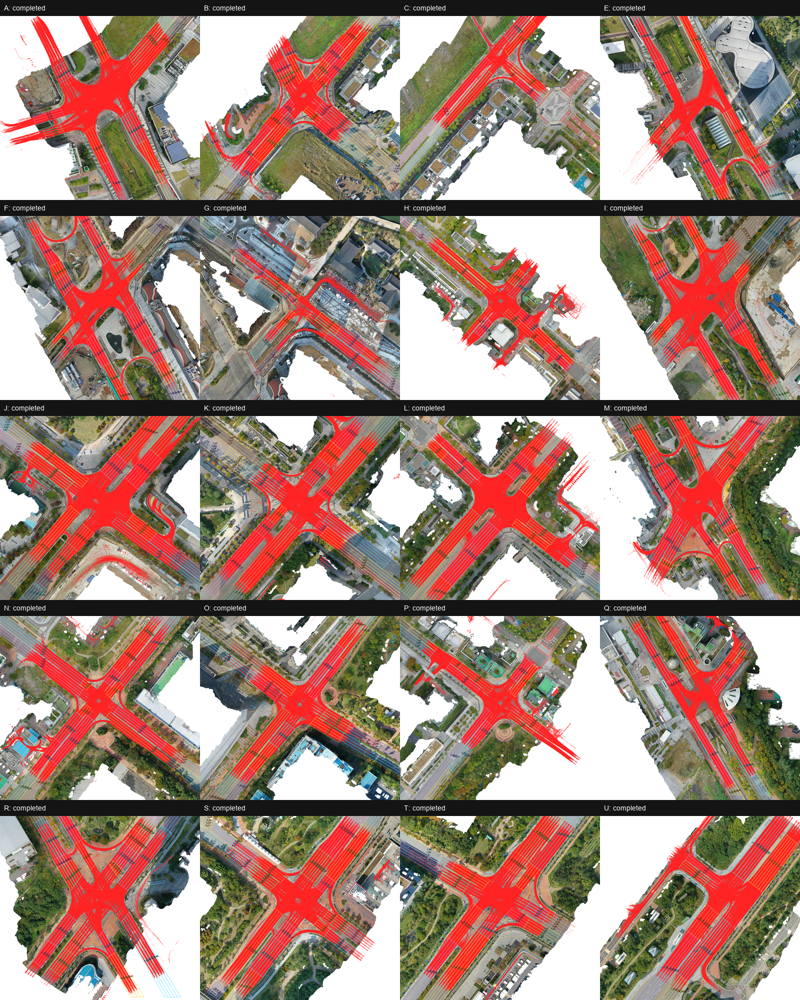

개별 지점 전체 관측점 지도: C:\Users\123\Documents\(송도) 교통 연구 논문\data\processed\songdo_route_geometry\20260916T134547Z_047caf90\site_overviews
모든 지점이 completed인지 표와 함께 확인하세요. 회색 미완료 패널은 관측 부재를 뜻하지 않습니다.


In [11]:
contact = Image.new("RGB", (DISPLAY_SIZE, 2000), "white")
for index, site in enumerate(SITES):
    if site in usable_sites:
        with Image.open(RUN_DIR / "site_overviews" / (site + "_observed_points.png")) as saved:
            panel = saved.convert("RGB").resize((400, 400), Image.Resampling.LANCZOS)
    else:
        panel = Image.new("RGB", (400, 400), (235, 235, 235))
    drawing = ImageDraw.Draw(panel)
    status = str(site_summary.loc[site_summary["site"].eq(site), "status"].iloc[0])
    drawing.rectangle((0, 0, 399, 31), fill=(20, 20, 20))
    drawing.text((8, 8), f"{site}: {status}", font=font, fill="white")
    contact.paste(panel, ((index % 4) * 400, (index // 4) * 400))
save_image(contact, RUN_DIR / "all_20_sites_observed_points.png")
display(contact)
run_metadata["map_overview_status"] = "all_20_site_panels_saved"
save_json(run_metadata, RUN_DIR / "run_metadata.json")
print("개별 지점 전체 관측점 지도:", RUN_DIR / "site_overviews")
print("모든 지점이 completed인지 표와 함께 확인하세요. 회색 미완료 패널은 관측 부재를 뜻하지 않습니다.")


## 12. 필요한 지점·경로만 명시적으로 확대하기 — 기본 생략
전체 20지점 결과를 먼저 확인했습니다. 추가로 볼 지점이 있을 때만 `SELECT_SITE`를 입력하세요. 경로 ID를 비워 두면 그 지점의 모든 관측점, 경로 ID를 지정하면 해당 순서에 속한 **모든 처리 차량의 점**을 표시합니다. 자동으로 A나 대표 차량을 선택하지 않습니다.


In [12]:
SELECT_SITE = None  # 예: "A"; None이면 추가 확대 생략
SELECT_ROUTE_ID = None  # 선택 지점 route_geometry_catalog의 전체 route_id; None이면 해당 지점 전체
if SELECT_SITE is None:
    if SELECT_ROUTE_ID is not None:
        raise ValueError("경로 ID를 지정하려면 지점도 지정하세요.")
    print("추가 확대 생략. 위에서 전체 20개 지점을 표시했습니다.")
else:
    if SELECT_SITE not in usable_sites:
        raise ValueError("저장된 관측점 결과가 있는 지점을 선택하세요.")
    selected_catalog = geometry_catalog.loc[geometry_catalog["site"].eq(SELECT_SITE)]
    with np.load(RUN_DIR / "site_pixels" / (SELECT_SITE + "_routes.npz"), allow_pickle=False) as archive:
        if SELECT_ROUTE_ID is None:
            selected = selected_catalog
            parts = [archive[r] for r in selected["route_id"]]
            pixels = np.unique(np.concatenate(parts)) if parts else np.array([], dtype=np.uint32)
            suffix = "all_routes"
        else:
            selected = selected_catalog.loc[selected_catalog["route_id"].eq(str(SELECT_ROUTE_ID))]
            if len(selected) != 1:
                raise ValueError("선택 지점의 전체 경로 ID를 지정하세요.")
            pixels = archive[str(SELECT_ROUTE_ID)]
            suffix = str(SELECT_ROUTE_ID)
    caption = f"{SELECT_SITE} | {suffix} | observed locations only; all processed member vehicles"
    canvas = draw_map(SELECT_SITE, pixels, caption)
    save_image(canvas, RUN_DIR / "selected_review" / (SELECT_SITE + "_" + suffix + ".png"))
    display(canvas)
    display(selected[["route_id", "section_sequence_json", "geometry_status", "n_processed_trajectories",
                       "n_observed_rows", "n_plotted_rows", "n_unique_display_pixels", "n_nonfinite_rows", "n_outside_rows"]])
    if len(pixels) == 0:
        print("표시 가능한 관측점이 없습니다. 무관측·좌표 오류·부분 처리 여부를 표의 건수와 상태로 구분하세요.")


추가 확대 생략. 위에서 전체 20개 지점을 표시했습니다.


## 13. 저장 후 다음 단계
전체 위치 대조는 번호 순서와 지도 위치를 연결하기 위한 것입니다. **7,228개 경로를 사람이 전부 분류해야만 다음 분석이 가능하다는 뜻은 아닙니다.** 이번 대조에서 확인한 자료 조건을 바탕으로 대상 접근차로·교차경로와 차량 관계의 사건 명세를 정리합니다.

이 점 그림에는 시간·진행 방향·동시관측 여부가 없으므로 앞뒤 차량, 경로 교차 시각, 상충이나 위험성을 판단하지 않습니다. 해당 판단은 이후 원시각·운동 정보를 활용하는 별도 단계입니다.


In [13]:
print(json.dumps({"실행_ID": RUN_ID, "상태": run_metadata["status"], "01_출처": SOURCE01_ID, "02_출처": SOURCE02_ID,
                  "처리파일": run_metadata["completed_files"], "전체파일": 800,
                  "지점출력": run_metadata["sites_with_saved_outputs"], "전체지점": 20,
                  "카탈로그경로수": len(geometry_catalog),
                  "저장출력에포함된궤적수": int(geometry_catalog["n_processed_trajectories"].sum()),
                  "결과폴더": str(RUN_DIR),
                  "해석": "전체 관측 위치와 제공 도로 구역의 지도 대조. 시간·방향·차량쌍·상충·TTC/PET·EVT 분석 아님."},
                 ensure_ascii=False, indent=2))
print("노트북을 저장하세요. 지점별 상태·관측점 지도와 좌표 품질 건수를 함께 검토합니다.")


{
  "실행_ID": "20260916T134547Z_047caf90",
  "상태": "completed",
  "01_출처": "20260916T063821Z_28f9e8ee",
  "02_출처": "20260916T084027Z_f3ab95c0",
  "처리파일": 800,
  "전체파일": 800,
  "지점출력": 20,
  "전체지점": 20,
  "카탈로그경로수": 7228,
  "저장출력에포함된궤적수": 688840,
  "결과폴더": "C:\\Users\\123\\Documents\\(송도) 교통 연구 논문\\data\\processed\\songdo_route_geometry\\20260916T134547Z_047caf90",
  "해석": "전체 관측 위치와 제공 도로 구역의 지도 대조. 시간·방향·차량쌍·상충·TTC/PET·EVT 분석 아님."
}
노트북을 저장하세요. 지점별 상태·관측점 지도와 좌표 품질 건수를 함께 검토합니다.
